In [178]:
# List configurable items
# %config

In [179]:
%load_ext autoreload
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [180]:
import pathlib
import functools

import matplotlib as mpl
mpl.style.use('bmh')
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
import numpy as np
import geopandas as gpd
from shapely import geometry
import rasterio
from rasterio.transform import (
    Affine,
    from_bounds,
)
from rasterio.crs import CRS
from rasterio.features import rasterize


# Create raster data from set of [InSAR](https://site.tre-altamira.com/insar/) data

Input data ([source](https://github.com/Kortforsyningen/PITSA/blob/master/pitsa.py))

```
GRID_SCHEMA = {
    "geometry": "Point",
    "properties": {
        "CODE": "str:7",  # Point ID
        "VEL_V": "float",  # Vertical velocity
        "VEL_STD_V": "float",  # Standard deviation of vertical velocity
        "VEL_V_NOUPLIFT": "float",  # Vertical velocity with uplift removed
        "VEL_STD_V_NOUPLIFT": "float",  # Standard deviation of the above
        "VEL_E": "float",  # Easterly velocity
        "VEL_STD_E": "float",  # Standard deviation of easterly velocity
    },
}
```

In [181]:
base_path = pathlib.Path.home() / 'git' / 'diveg'
data_path = base_path / 'data'
output_path = base_bath / 'notebooks/exploration'

In [6]:
ifname_insar = data_path / 'insar.gpkg'
layer = '2D'

In [ ]:
# This takes roughly 30 seconds on the Linux Server (unknown number of CPUs used)
gdf = gpd.read_file(ifname_insar, layer=layer)

In [8]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [9]:
# 15 seconds on Linux Server
gdf = gdf.to_crs('epsg:25832')

In [10]:
gdf.crs

<Projected CRS: EPSG:25832>
Name: ETRS89 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°E and 12°E: Austria; Belgium; Denmark - onshore and offshore; Germany - onshore and offshore; Norway including - onshore and offshore; Spain - offshore.
- bounds: (6.0, 38.76, 12.0, 83.92)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [12]:
# Takes approximately 1 min on Linux Server
# gdf.plot(figsize=(12, 12))

## Cell Parameters

The purpose of this section is to create an proof-of-concept and an illustration of what needs to be achieved in order to make a raster image with cells containing the value (one with the mean and one with the standard deviation) of the points within each cell.


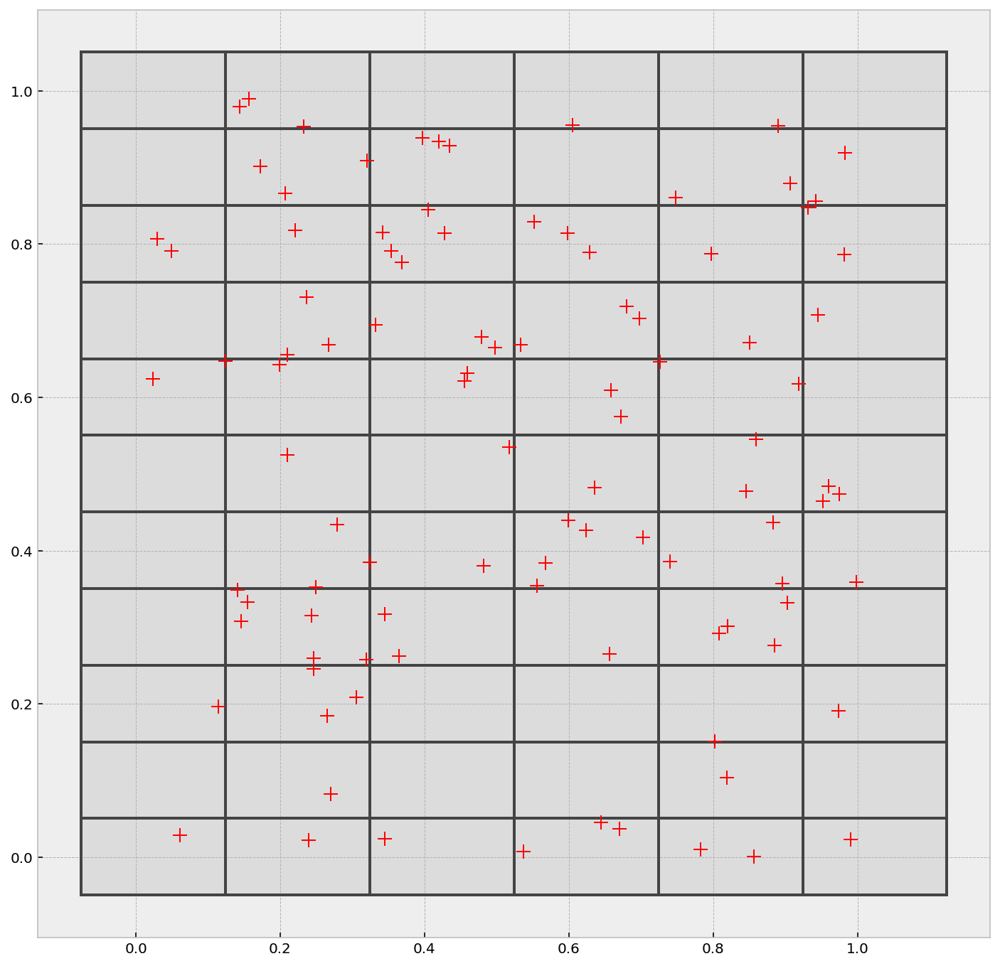

In [13]:
# Generate random points for illustration
xs, ys = np.random.random(size=(2, 100))

# Use maximums and minimums to define outer boundary of the grid that contain the points
xmin, xmax = min(xs), max(xs)
ymin, ymax = min(ys), max(ys)

# Define the size of the grid cells
width_cell = .2
height_cell = .1

# Generate the x coordinates for the corners of each cell
cell_bounds_x = np.arange(
    xmin - width_cell / 2,
    # In the following line, I add a whole width_cell
    # to get the end coordinate needed to make the grid.
    xmax + width_cell,
    width_cell,
)
# Extract the grid boundary along the x axis
xmin_grid, xmax_grid = min(cell_bounds_x), max(cell_bounds_x)

# Generate the y coordinates for the corners of each cell
cell_bounds_y = np.arange(
    ymin - height_cell / 2,
    # In the following line, I add a whole height_cell
    # to get the end coordinate needed to make the grid.
    ymax + height_cell,
    height_cell,
)
# Extract the grid boundary along the y axis
ymin_grid, ymax_grid = min(cell_bounds_y), max(cell_bounds_y)

# Create the sets of points to be plotted
grid_lines = []
# Add vertical lines (between y min and y max)
for grid_x in cell_bounds_x:
    grid_lines.append(
        [
            (grid_x, ymin_grid),
            (grid_x, ymax_grid),
        ]
    )
# Add horisontal lines (between x min and x max)
for grid_y in cell_bounds_y:
    grid_lines.append(
        [
            (xmin_grid, grid_y),
            (xmax_grid, grid_y),
        ]
    )

# Create the sets of data points to be plotted
data_points = zip(xs, ys)

# Create separate Matplotlib-Recangle patches for the cells
# cell_grid = [
#     mpl.patches.Rectangle(...)
# ]

# Layout
pkw_grid = dict(ls='-', marker='None', color='#444444')
pkw_data = dict(ls='None', marker='+', ms='10', mec='#ff0000')

fig, ax = plt.subplots(figsize=(12, 12))

# Add a rectangle showing the boundary
grid_bounds = mpl.patches.Rectangle(
    xy=(xmin_grid, ymin_grid),
    width=(xmax_grid - xmin_grid),
    height=(ymax_grid - ymin_grid),
    color='#cccccc',
    zorder=-1,
    alpha=.5
)
ax.add_patch(grid_bounds)

# Simply plot the (straight) line that the two ranges create between (xmin, ymin) and (xmax, ymax)
# ax.plot(cell_bounds_x.ravel(), cell_bounds_y.ravel(), **pkw_grid)

# Plot the vertical and horisontal lines that illustrate the cell boundaries of the grid
# TODO (if time for it): Make this more elegant
for (p1, p2) in grid_lines:
    xcoords = [p1[0], p2[0]]
    ycoords = [p1[1], p2[1]]
    ax.plot(xcoords, ycoords, **pkw_grid)

# Plot the simulated data
ax.plot(xs, ys, **pkw_data)
# ax.axis("off")

plt.savefig(base_path / 'docs/assets/grid_concept.pdf')
plt.savefig(base_path / 'docs/assets/grid_concept.png')


### Build test raster image with `rasterio`

The purpose of this section is to create a proof-of-concept for creating a raster image from the ground up using `rasterio`.

The code builds on the grid-creation procedure in the above illustration.

In addition to creating the raster image, the code below shows how to create an image that has different resolution in the x and y dimensions.

cell_width=320, cell_height=320
grid_x=array([ -40.,  280.,  600.,  920., 1240., 1560., 1880., 2200.]), grid_y=array([ -40.,  280.,  600.,  920., 1240.])


(5, 8)

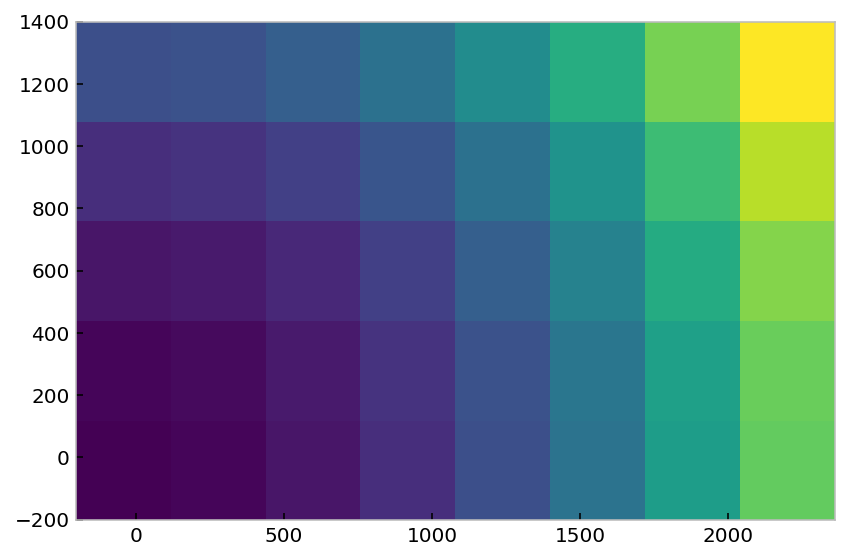

In [14]:
# Imagined point boundary
minx, maxx, miny, maxy = 0, 2000, 0, 1000

# The point boundary must be padded with half the point distance to wither side of the most extreme points

# Cell resolution
N_points_x = 4
N_points_y = 4
point_distance = 80  # [m]

# Derive cell dimnesions
cell_width = N_points_x * point_distance
cell_height = N_points_y * point_distance
print(f'{cell_width=}, {cell_height=}')

# Create the cell positions
# Each cell boundary has a padding to the contained points of half the point distance,
# i.e the cells's positions are shifted half the point distance,
# i.e. starting at -1/2 * point_distance in each direction
# Note: The end position of the farthest cell from the grid origin will be larger.
# Note (cont'd): This must be OK, since the points's position are not precise, and the size of the cells arbitrary.
grid_x = np.arange(minx, maxx + cell_width, cell_width) - point_distance / 2
grid_y = np.arange(miny, maxy + cell_height, cell_height) - point_distance / 2
print(f'{grid_x=}, {grid_y=}')

# Using Numpy's meshgrid function, include the last 
grid_X, grid_Y = np.meshgrid(grid_x, grid_y)

grid_data = grid_X ** 2 + grid_Y ** 2

fig, ax = plt.subplots()
# ax.imshow(grid_data, origin='lower')
ax.pcolor(grid_X, grid_Y, grid_data, shading='auto')

plt.tight_layout()
plt.savefig(base_path / 'docs/assets/raster_concept.pdf')
plt.savefig(base_path / 'docs/assets/raster_concept.png')

grid_data.shape

In [15]:
# TODO: Unpack this
transform = Affine.translation(
    grid_X[0][0] - cell_width / 2,
    grid_Y[0][0] - cell_height / 2
) * Affine.scale(
    cell_width,
    cell_height
)
transform


Affine(320.0, 0.0, -200.0,
       0.0, 320.0, -200.0)

In [16]:
crs = CRS.from_epsg(25832)
crs.data

{'init': 'epsg:25832'}

In [17]:
with rasterio.open(
    base_path / 'docs/assets/raster_concept.tif',
    'w',
    driver='GTiff',
    height=grid_data.shape[0],
    width=grid_data.shape[1],
    count=1,
    dtype=grid_data.dtype,
    crs=crs,
    transform=transform,
) as output:
    output.write(grid_data, 1)


# Prototype: Total bounds and cell bounds for the final product

Do the same as above, but:

* counting the number of samples in each cell.
* using geo-tools for creating the grid (cell) geometries
* make set operations for aggregating poiints in each cell

Performance and future-proofing

* Start with a small set of the data and scale up gradually
* Time the steps
* Choose the best tool for the job; basic numpy/scipy, shapely, pandas, geopandas?

Understanding

* Write out in your own words the goal of this milestone.

In [18]:
# 5 seconds on the Linux Server
# Returns a tuple containing ``minx``, ``miny``, ``maxx``, ``maxy``
minx, miny, maxx, maxy = gdf.total_bounds

In [19]:
print(f'{minx=}, {miny=}, {maxx=}, {maxy=}')

minx=442033.5439726943, miny=6049880.542620567, maxx=740409.1828369338, maxy=6401875.3958258275


In [182]:
# Cell resolution
N_points_x = 30
N_points_y = 30
point_distance = 80  # [m]

# The cells's side length in a given direction (x or y) is the point distance times the number of points
cell_width = N_points_x * point_distance
cell_height = N_points_y * point_distance

# OBSOLETE: To make the cell borders appear midway between two points that are point_distance from each other,
# OBSOLETE: the offset of each cell should be half the point distance in each direction.
grid_x = np.arange(minx, maxx + cell_width, cell_width) - point_distance / 2
grid_y = np.arange(miny, maxy + cell_height, cell_height) - point_distance / 2

# Create bounding-box coordinates for each cell in the grid
# Make a cell (geometry) grid off these coordinates

cells = [
    geometry.box(
        cell_minx,
        cell_miny,
        cell_minx + cell_width,
        cell_miny + cell_height,
    )
    for cell_minx in grid_x
    for cell_miny in grid_y
]

# Build geometries into geopandas dataframe
grid = gpd.GeoDataFrame(cells, columns=['geometry'], crs=gdf.crs)

In [183]:
print(f'Number of cells ({grid_y.size=}) x ({grid_x.size=}) = {(grid_y.size) * (grid_x.size)=}')

Number of cells (grid_y.size=148) x (grid_x.size=126) = (grid_y.size) * (grid_x.size)=18648


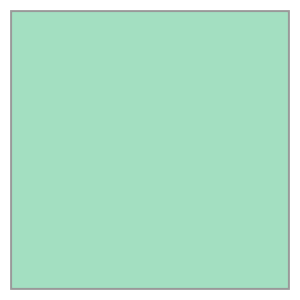

In [184]:
cells[0]

### Display the cells over the points

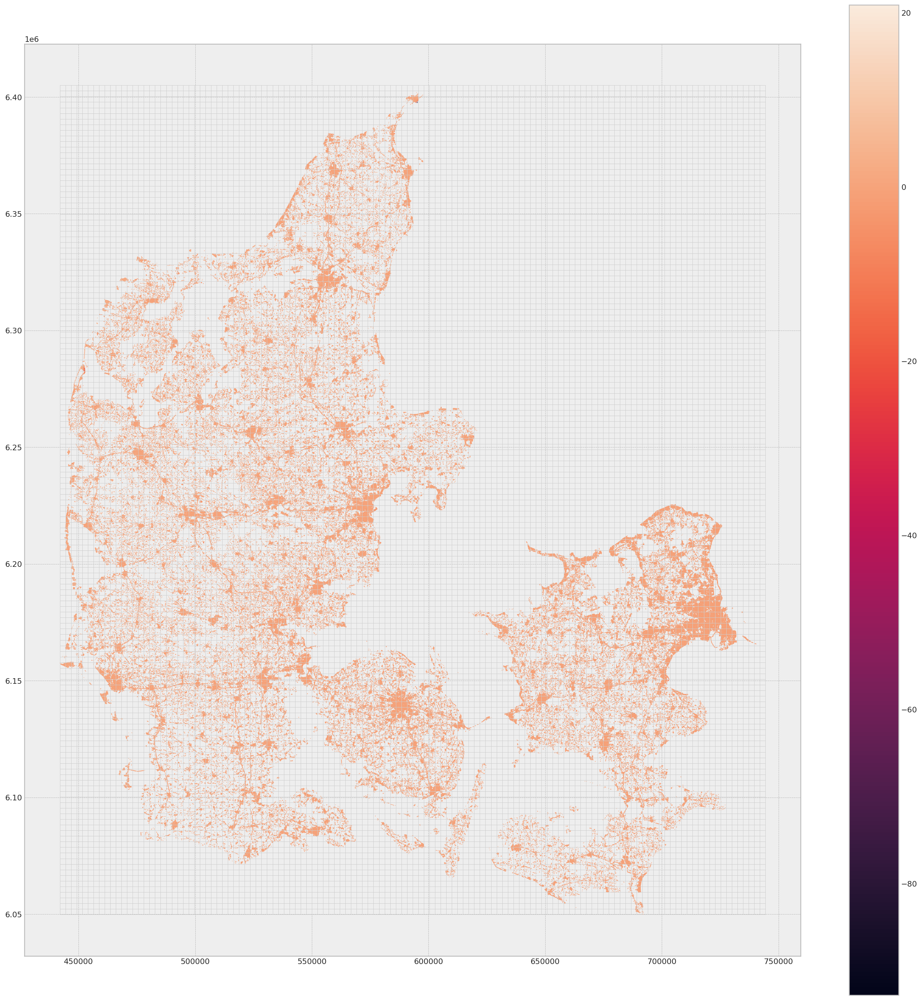

In [185]:
# Takes about a minute on the Linux Server
# Plot the cell grid with the data
fig, ax = plt.subplots(figsize=(20, 20))
gdf.plot(ax=ax, markersize=.1, column='VEL_V', legend=True)
grid.plot(ax=ax, facecolor='none', edgecolor='#cccccc')
fig.tight_layout()
plt.savefig(output_path / f'VEL_V_grid_{cell_width:.0f}x{cell_height:.0f}.pdf')
# Creating the .png image at 300 DPI takes minutes (kernel killed, before finishing).
plt.savefig(output_path / f'VEL_V_grid_{cell_width:.0f}x{cell_height:.0f}.png')

### Merge the points with the grid, i.e. bin the data

In [186]:
# Time: < 30 seconds
# Spatial join: collect points inside each grid cell
merged = gpd.sjoin(gdf, grid, how='left', op='within')

In [233]:
def iqr(a: np.ndarray) -> float:
    """
    Calculate the range covered by the middle 50 % of the input values.
    
    Using statistical terms, calculate the difference between the third
    and the first quartiles (the inter-quartile range, IQR).

    Example
    -------
    
    >>> x = np.arange(6) * 5
    # array([ 0,  5, 10, 15, 20])
    >>> np.cumsum(x)
    # array([ 0,  5, 15, 30, 50], dtype=int32)
    >>> a, b = np.percentile(x, [25, 75])
    >>> (a, b)
    # (5.0, 15.0)
    >>> IQR = b - a
    >>> IQR
    # 10.0
    
    """
    a, b = np.percentile(np.asarray(a), [25, 75])
    return b - a


In [ ]:
# Time: < 20 seconds
# Aggregate the data
columns = (
    'VEL_V',
    'VEL_V_NOUPLIFT',
    'VEL_E',
)
aggregates = (
    'count',
    'mean',
    'std',
    'median',
    'min',
    'max',
    iqr,
    list,
)

dissolved = merged.dissolve(
    by='index_right',
    aggfunc={column: aggregates for column in columns},
)

In [281]:
dissolved.head()

,geometry,"(VEL_V, count)","(VEL_V, mean)","(VEL_V, std)","(VEL_V, median)","(VEL_V, min)","(VEL_V, max)","(VEL_V, iqr)","(VEL_V, list)","(VEL_V_NOUPLIFT, count)",...,"(VEL_V_NOUPLIFT, iqr)","(VEL_V_NOUPLIFT, list)","(VEL_E, count)","(VEL_E, mean)","(VEL_E, std)","(VEL_E, median)","(VEL_E, min)","(VEL_E, max)","(VEL_E, iqr)","(VEL_E, list)"
index_right,,,,,,,,,,,,,,,,,,,,,
44,"MULTIPOINT (442033.544 6157557.005, 442352.774...",165,0.452121,1.877647,0.70,-6.1,5.0,2.300,"[2.5, 1.9, 1.5, 2.1, 2.1, 2.2, -1.2, 4.1, 1.6,...",165,...,2.300,"[2.9, 2.3, 1.9, 2.5, 2.5, 2.6, -0.8, 4.5, 2.0,...",165,0.100000,1.741110,0.00,-4.8,6.3,1.700,"[1.1, -1.5, -0.7, -3.6, 0.5, -0.3, 3.4, 1.6, -..."
45,"MULTIPOINT (444015.546 6159774.649, 444020.668...",3,0.833333,3.429772,2.40,-3.1,3.2,3.150,"[-3.1, 3.2, 2.4]",3,...,3.150,"[-2.7, 3.6, 2.8]",3,-1.000000,1.600000,-1.00,-2.6,0.6,1.600,"[-2.6, -1.0, 0.6]"
46,"MULTIPOINT (443291.726 6160424.944, 444186.411...",2,-0.050000,2.050610,-0.05,-1.5,1.4,1.450,"[1.4, -1.5]",2,...,1.450,"[1.8, -1.1]",2,0.500000,2.969848,0.50,-1.6,2.6,2.100,"[-1.6, 2.6]"
67,"MULTIPOINT (444111.264 6211133.722, 444112.305...",14,1.300000,3.200721,1.60,-7.2,5.3,3.175,"[0.3, 5.3, 4.9, 2.8, -1.9, 1.5, 0.4, 0.2, 3.6,...",14,...,3.175,"[0.8, 5.8, 5.4, 3.3, -1.4, 2.0, 0.9, 0.7, 4.1,...",14,1.092857,2.260859,1.60,-2.0,4.4,3.875,"[4.4, -2.0, 3.2, 3.6, 3.1, 1.7, -0.2, -0.9, -0..."
68,"MULTIPOINT (444229.065 6214016.821, 444231.144...",10,1.770000,2.723988,0.95,-3.0,6.1,2.700,"[-3.0, 3.2, 0.9, 0.8, 1.0, 5.2, 0.6, -0.5, 3.4...",10,...,2.700,"[-2.5, 3.7, 1.4, 1.3, 1.5, 5.7, 1.1, 0.0, 3.9,...",10,-0.460000,2.610321,-0.75,-5.4,3.7,3.100,"[3.7, -1.4, 2.0, 1.1, 1.3, -2.4, -1.4, -0.1, -..."


In [282]:
dissolved.shape, dissolved.dropna().shape

((8165, 25), (8051, 25))

In [299]:
grid = grid.to_crs('epsg:4326')

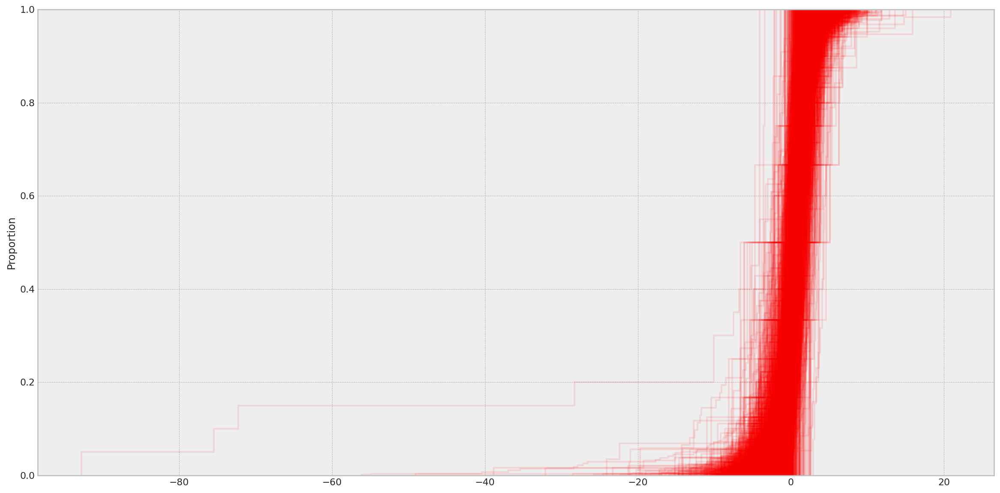

In [251]:
# TIME: > 5 min
points = dissolved.dropna()[('VEL_V', 'list')]
points.name = 'VEL_V_data'
# points = points.to_frame()

points.head()

fig, ax = plt.subplots(figsize=(20, 10))
for (ix, row) in points.iteritems(): #.iterrows():
    sns.ecdfplot(row, ax=ax, color='#ff0000', alpha=.1)
plt.savefig(output_path / f'VEL_V_binned_cell-ecdf_{cell_width:.0f}x{cell_height:.0f}.pdf')


<AxesSubplot:>

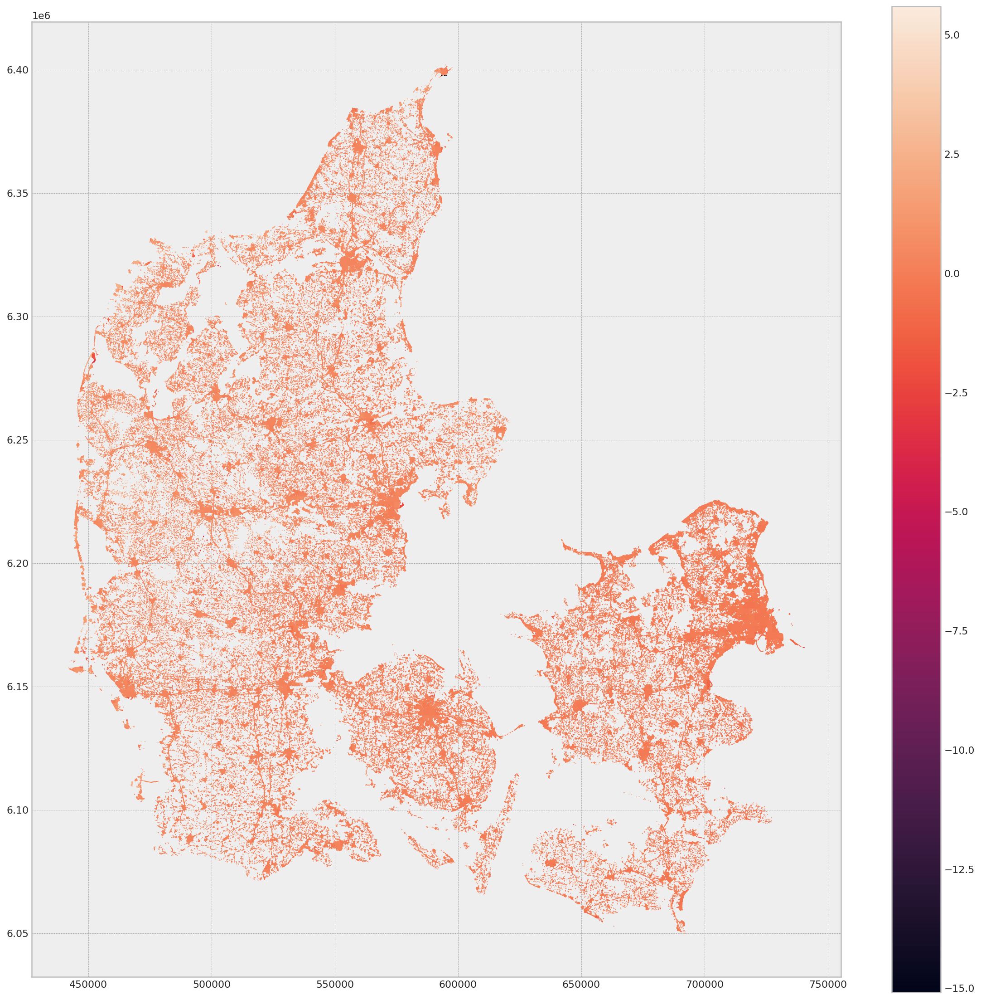

In [253]:
dissolved.plot(figsize=(20, 20), markersize=.1, column=('VEL_V', 'mean'), legend=True)

### Associate the aggregated values to the geometry of the grid cells containing them

In [300]:
# Create a new GeoDataFrame for shorter names
stat_columns = ('count', 'mean', 'std', 'median', 'min', 'max', 'iqr', 'list')

def get_grid_copy(source_column, *, stat_columns=stat_columns):
    grid_copy = grid.copy()
    for colname in stat_columns:
    # Prefix column names with a '_'
        grid_copy.loc[dissolved.index, f'_{colname}'] = dissolved[(source_column, colname)].values
    return grid_copy

vel_v = get_grid_copy('VEL_V')
vel_v_nouplift = get_grid_copy('VEL_V_NOUPLIFT')

In [301]:
print(vel_v.shape)
vel_v = vel_v.dropna()
print(vel_v.shape)
vel_v.head()


(18648, 9)
(8051, 9)


,geometry,_count,_mean,_std,_median,_min,_max,_iqr,_list
44,"POLYGON ((8.11879 55.54183, 8.11831 55.56339, ...",165.0,0.452121,1.877647,0.70,-6.1,5.0,2.300,"[2.5, 1.9, 1.5, 2.1, 2.1, 2.2, -1.2, 4.1, 1.6,..."
45,"POLYGON ((8.11831 55.56339, 8.11783 55.58495, ...",3.0,0.833333,3.429772,2.40,-3.1,3.2,3.150,"[-3.1, 3.2, 2.4]"
46,"POLYGON ((8.11783 55.58495, 8.11735 55.60651, ...",2.0,-0.050000,2.050610,-0.05,-1.5,1.4,1.450,"[1.4, -1.5]"
67,"POLYGON ((8.10753 56.03775, 8.10703 56.05931, ...",14.0,1.300000,3.200721,1.60,-7.2,5.3,3.175,"[0.3, 5.3, 4.9, 2.8, -1.9, 1.5, 0.4, 0.2, 3.6,..."
68,"POLYGON ((8.10703 56.05931, 8.10653 56.08087, ...",10.0,1.770000,2.723988,0.95,-3.0,6.1,2.700,"[-3.0, 3.2, 0.9, 0.8, 1.0, 5.2, 0.6, -0.5, 3.4..."


In [302]:
print(vel_v_nouplift.shape)
vel_v_nouplift = vel_v_nouplift.dropna()
print(vel_v_nouplift.shape)
vel_v_nouplift.head()

(18648, 9)
(8051, 9)


,geometry,_count,_mean,_std,_median,_min,_max,_iqr,_list
44,"POLYGON ((8.11879 55.54183, 8.11831 55.56339, ...",165.0,0.852121,1.877647,1.10,-5.7,5.4,2.300,"[2.9, 2.3, 1.9, 2.5, 2.5, 2.6, -0.8, 4.5, 2.0,..."
45,"POLYGON ((8.11831 55.56339, 8.11783 55.58495, ...",3.0,1.233333,3.429772,2.80,-2.7,3.6,3.150,"[-2.7, 3.6, 2.8]"
46,"POLYGON ((8.11783 55.58495, 8.11735 55.60651, ...",2.0,0.350000,2.050610,0.35,-1.1,1.8,1.450,"[1.8, -1.1]"
67,"POLYGON ((8.10753 56.03775, 8.10703 56.05931, ...",14.0,1.800000,3.200721,2.10,-6.7,5.8,3.175,"[0.8, 5.8, 5.4, 3.3, -1.4, 2.0, 0.9, 0.7, 4.1,..."
68,"POLYGON ((8.10703 56.05931, 8.10653 56.08087, ...",10.0,2.270000,2.723988,1.45,-2.5,6.6,2.700,"[-2.5, 3.7, 1.4, 1.3, 1.5, 5.7, 1.1, 0.0, 3.9,..."


In [303]:
max(vel_v._count), min(vel_v._count)

(828.0, 2.0)

Expected number of points in each cell: 900


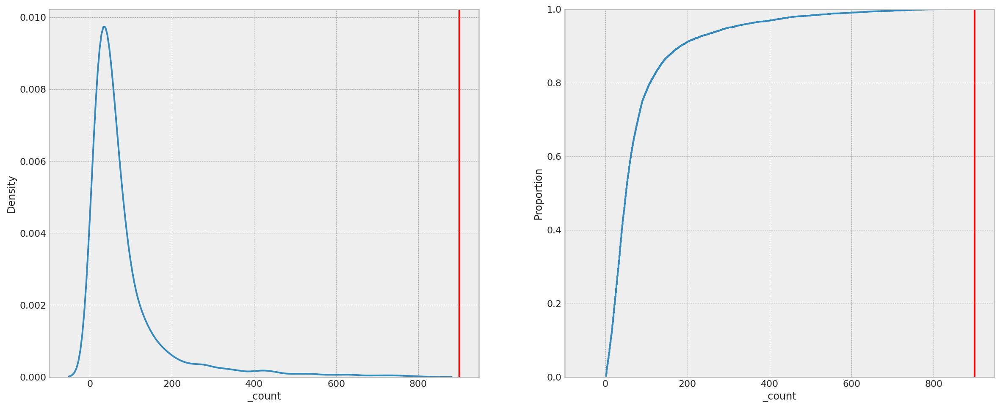

In [261]:
# How many cells have the maximunm amount of available points?
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 8), sharex=True)
sns.kdeplot(vel_v._count, ax=ax1)
# ax = vel_v._count.hist()
ax1.axvline(x=N_points_x * N_points_y, color='#ff0000')
sns.ecdfplot(vel_v._count, ax=ax2)
ax2.axvline(x=N_points_x * N_points_y, color='#ff0000')
print(f'Expected number of points in each cell: {N_points_x * N_points_y}')

Observations (made for 6x6 point grid)

* Most cells have much fewer than the expected number of points.
* There are a few cases, where the number of points in a cell is larger than the expected value.

Comments

From visual inspection of the point locations on a map, these two observations can be explained by large and small point-density areas. The Larger-density areas tend to be located near, around or on large infrastructure in the landscape such as highways and cities. The smaller-density areas are easiest to see near the coast lines, where the cell covers both land and not-land, in which case the expected number of points should be proportional to the relative land coverage of those cells.

Do these observations explain the large fraction (~ 80 %) of the cells that cover only a third of the expected number of points?


Text(0.5, 1.0, 'Detail')

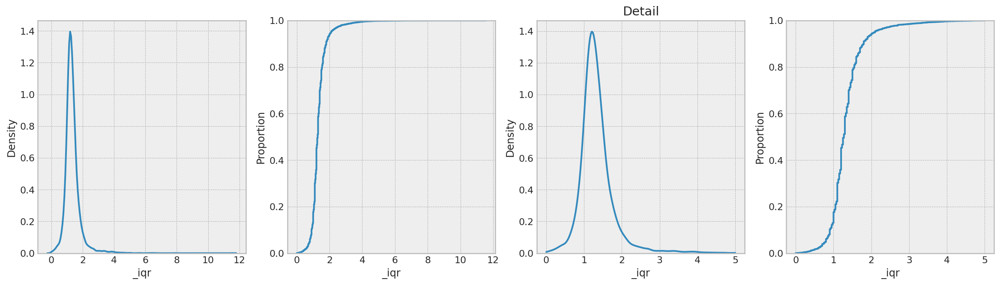

In [262]:
# What is the distribution of inter-quartile ranges (IQRs)?
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(20, 5))
sns.kdeplot(vel_v._iqr, ax=ax1)
sns.ecdfplot(vel_v._iqr, ax=ax2)
# Making the cut at 2 to better see the behaviour.
# The curve smoothly goes to a small level (< .1)
# at around 5, and towards zeros up until 50 or so.
sns.kdeplot(vel_v._iqr, ax=ax3, clip=(0, 5))
sns.ecdfplot(vel_v._iqr[vel_v._iqr <= 5], ax=ax4)
ax3.set_title('Detail')

Observations (made for 6x6 point grid)

* The inter-quartile range of the cells are most commonly somewhere between 0 and 5 with very few cells having a larger span covered by their middle 50 % range.

Comments

* It seems reasonable to skip the cells that have the largest IQR.

Observations (made for 30x30 point grid)

* The IQR plots show the same tendency with a larger bin (cell) size, i.e. with the plot ranges unchanged from the 6x6 grid to the 30x30 grid, the average IQR changes little.

Comments

* The small change in the IQR distribution when going from a smaller cell size to a larger could be explained by the fact that this should be the case when going from a distribution of a more localised (smaller area coverage over the whole country) to a larger coverage area per cell. In other words, the local picture seems to be the same overall. Since the difference in the measured quantity thus generally varies the same way, this whould also be the case, when looking at a the larger-scale resolution.

* It is less obvious that the implication should go the opposite way, since the larger areas smooth out the effect that smaller areas might show in the variation of their respective IQRs. The larger the scale (cell size) the less information about the specific local variation we get.



### Administrative borders

In [266]:
# Load commune borders to see the land around the cells
ifname_adm = pathlib.Path.home() / 'data' / 'KOMMUNE.shp'
adm = gpd.read_file(ifname_adm)
adm = adm.to_crs('epsg:4326')


### Outlier visualisation

In [263]:
# What cells have what we define as outliers?
iqr_too_large = (vel_v._iqr > 5)

# Velocity-mean outliers
vel_v_min = vel_v._mean.min()
vel_v_max = vel_v._mean.max()

vel_v_mean_abs_min = min(
    np.abs(vel_v_min),
    np.abs(vel_v_max),
)

print(f'{vel_v_mean_abs_min=}')

vel_mean_outside_allowed_range = (vel_v._mean < -vel_v_mean_abs_min) | (vel_v._mean > vel_v_mean_abs_min)



vel_v_mean_abs_min=4.4263157894736835


In [264]:
# Define the outliers
are_outliers = iqr_too_large | vel_mean_outside_allowed_range
cells_outliers = vel_v[are_outliers]
cells_outliers.shape

(14, 9)

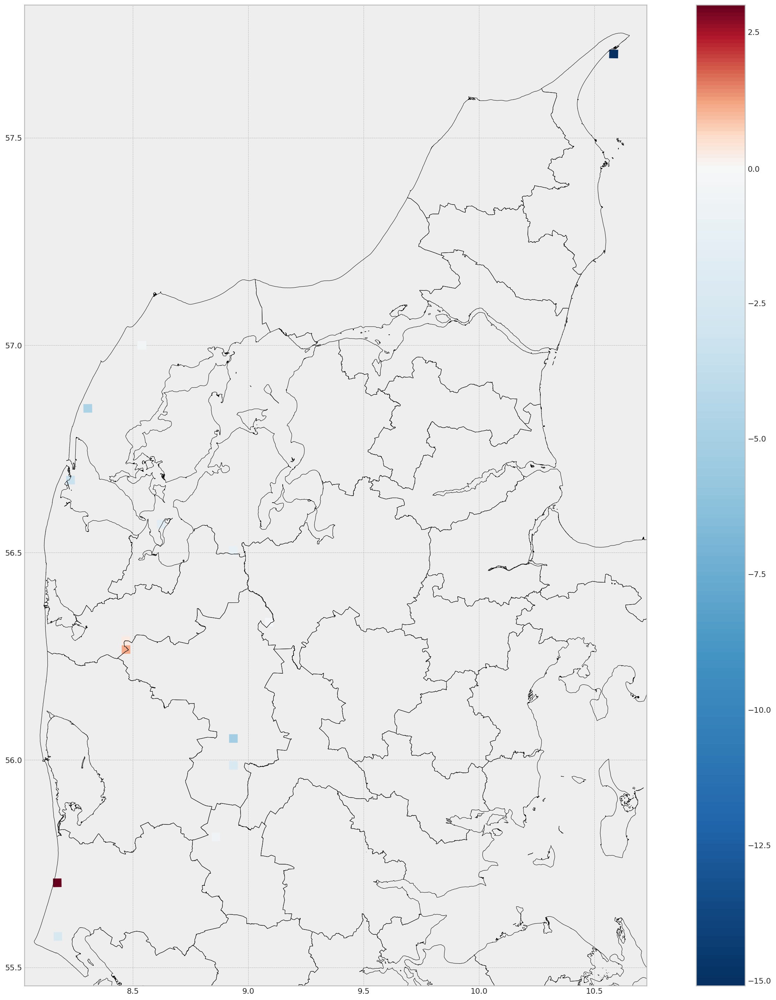

In [267]:
# Visualise the outlier cells
fig, ax = plt.subplots(figsize=(20, 20))
norm = colors.TwoSlopeNorm(vmin=cells_outliers._mean.min(), vcenter=0, vmax=cells_outliers._mean.max())
cells_outliers.plot(column='_mean', ax=ax, cmap='RdBu_r', norm=norm, legend=True)
plt.autoscale(False)
adm.plot(ax=ax, color='none', edgecolor='black')
fig.tight_layout()
plt.savefig(output_path / f'VEL_V_binned_outlier-cells_{cell_width:.0f}x{cell_height:.0f}.pdf')

### Plot the grid data

In [312]:
# Remove outlier cells and rename
if False:
    cells = vel_v[~are_outliers]
    dataset_name = 'VEL_V'
else:
    # Use the noupliftdata instead
    cells = vel_v_nouplift
    dataset_name = 'VEL_V_NOUPLIFT'

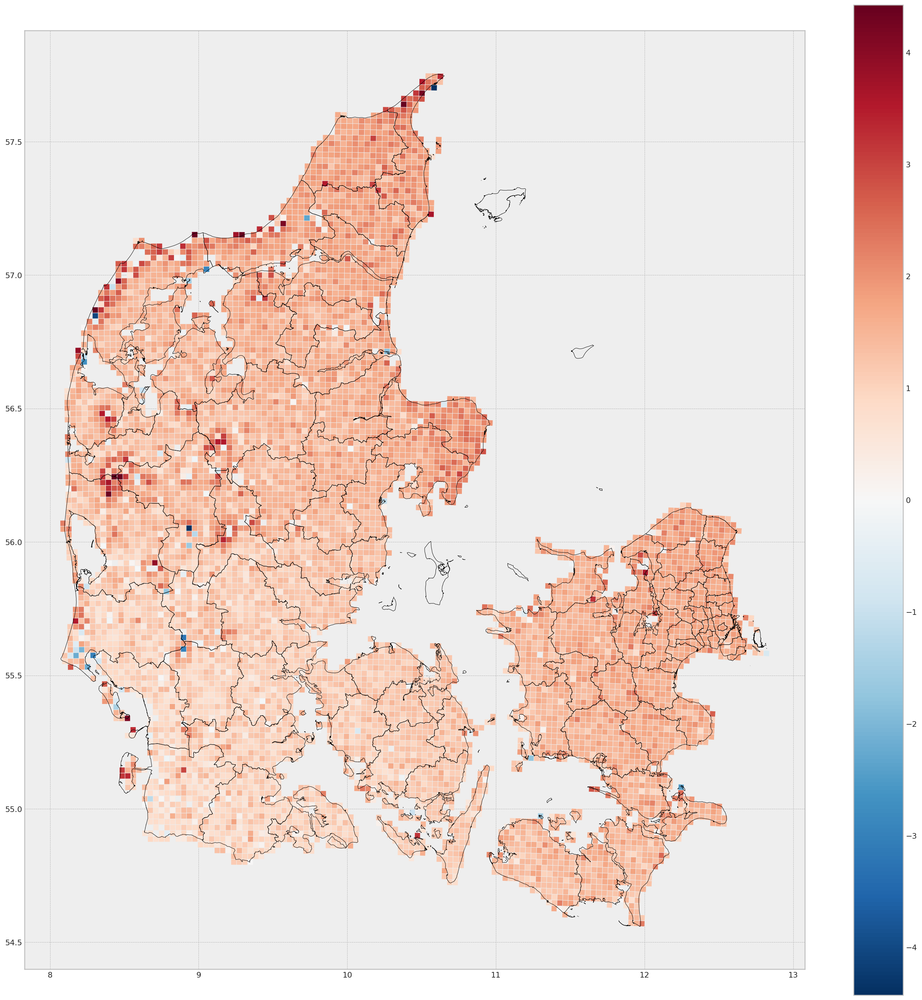

In [313]:
fig, ax = plt.subplots(figsize=(20, 20))
norm = colors.TwoSlopeNorm(vmin=-vel_v_mean_abs_min, vcenter=0, vmax=+vel_v_mean_abs_min)
cells.plot(column='_mean', ax=ax, cmap='RdBu_r', norm=norm, legend=True)
plt.autoscale(False)
adm.plot(ax=ax, color='none', edgecolor='black')
# ax.axis('off')
fig.tight_layout()
plt.savefig(output_path / f'{dataset_name}_binned_mean_{cell_width:.0f}x{cell_height:.0f}.pdf')

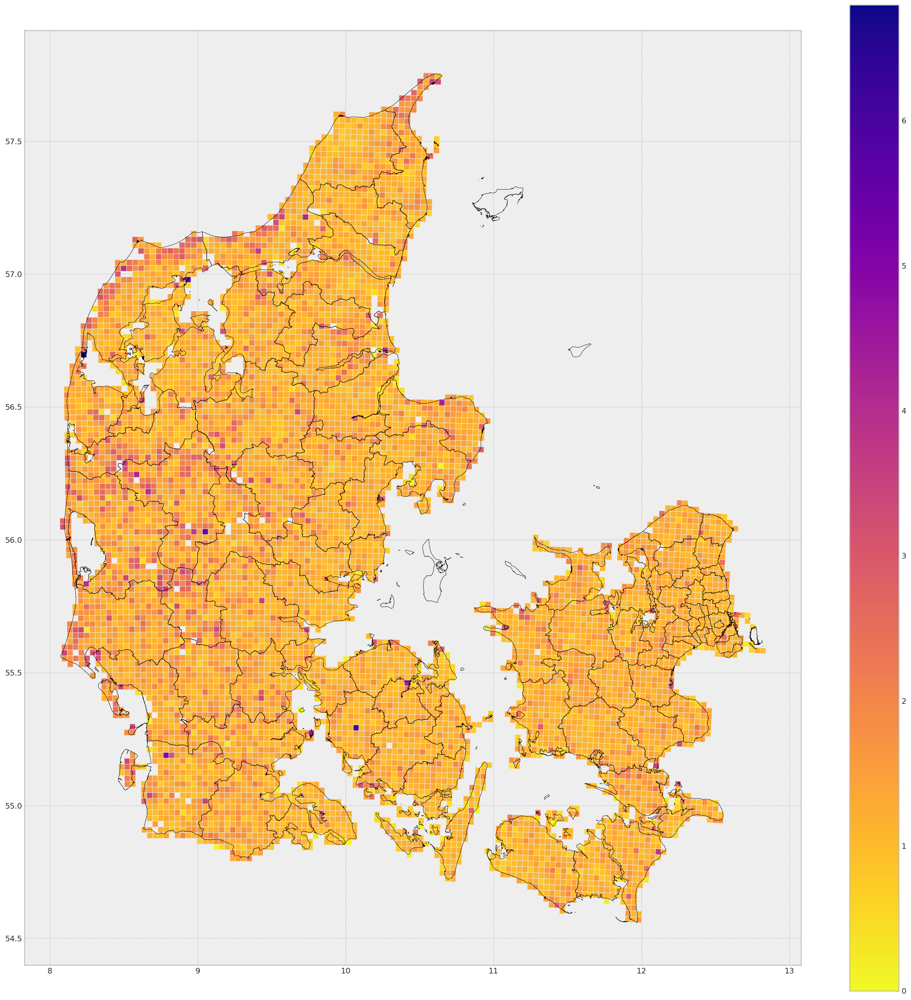

In [270]:
fig, ax = plt.subplots(figsize=(20, 20))
# norm_std = colors.LogNorm(vmin=cells._std.min(), vmax=cells._std.max())
cells.plot(column='_std', ax=ax, cmap='plasma_r', vmin=0, legend=True)
plt.autoscale(False)
adm.plot(ax=ax, color='none', edgecolor='black')
fig.tight_layout()
plt.savefig(output_path / f'{dataset_name}_binned_std_{cell_width:.0f}x{cell_height:.0f}.pdf')

In [271]:
# Use the from_bounds function in transform module:
transform = from_bounds(*vel_v.total_bounds, grid_x.size, grid_y.size)
transform


Affine(0.03787999531074284, 0.0, 8.067973790140018,
       0.0, -0.02160686590121278, 57.756651768690716)

In [272]:
def get_shapes(gdf: gpd.GeoDataFrame, colname: str) -> list:
    """
    Extract and associate and format geometry and data in GeoDataFrame.

    """
    assert 'geometry' in gdf.columns, f'Expected `geometry` in {gdf.columns=}'
    assert colname in gdf.columns, f'Expected {colname!r} in {gdf.columns=}.'
    return [
        (shape, value)
        for (shape, value)
        in zip(
            gdf.geometry,
            gdf[colname]
        )
    ]
    

In [273]:
shapes_mean = get_shapes(vel_v, '_mean')
shapes_std = get_shapes(vel_v, '_std')
shapes_mean[0]

(<shapely.geometry.polygon.Polygon at 0x7f8e3b862eb0>, 0.45212121212121237)

In [274]:
rasterise = functools.partial(
    rasterize,
    out_shape=(grid_y.size, grid_x.size),
    transform=transform,
    all_touched=True,
    dtype=vel_v._mean.dtype
)

In [275]:
raster_mean = rasterise(shapes=shapes_mean)
raster_std = rasterise(shapes=shapes_std)

### Save the two grids as separate bands in one GeoTIFF file

In [276]:
# Build raster image
with rasterio.open(
    output_path / f'insar_grid_{cell_width:.0f}x{cell_height:.0f}.tif',
    'w+',
    driver='GTiff',
    height=grid_y.size,
    width=grid_x.size,
    count=2,
    dtype=vel_v._mean.dtype,
    crs=vel_v.crs,
    transform=transform,
) as output:
    output.write_band(1, raster_mean)
    output.write_band(2, raster_std)


## Also create two separate files

In [277]:
# Build raster image
with rasterio.open(
    output_path / f'insar_grid_mean_{cell_width:.0f}x{cell_height:.0f}.tif',
    'w+',
    driver='GTiff',
    height=grid_y.size,
    width=grid_x.size,
    count=1,
    dtype=vel_v._mean.dtype,
    crs=vel_v.crs,
    transform=transform,
) as output:
    output.write(raster_mean, indexes=1)


In [278]:
# Build raster image
with rasterio.open(
    output_path / f'insar_grid_std_{cell_width:.0f}x{cell_height:.0f}.tif',
    'w+',
    driver='GTiff',
    height=grid_y.size,
    width=grid_x.size,
    count=1,
    dtype=vel_v._mean.dtype,
    crs=vel_v.crs,
    transform=transform,
) as output:
    output.write(raster_std, indexes=1)


## Exploration